**PART 1 - MANUAL SELECTION:**

In [ ]:
#IMPORT LIBRARIES
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from google.colab.patches import cv2_imshow

In [ ]:
#DEFINE FUNCTIONS
#Function from Homework 5
def computeH(im1_pts, im2_pts):
  n = im1_pts.size
  A = np.ones((n, 8))
  for i in range(int(n/2)):
    A[i*2][0] = im1_pts[i][0]
    A[i*2][1] = im1_pts[i][1]
    A[i*2][2] = 1
    A[i*2][3] = 0
    A[i*2][4] = 0
    A[i*2][5] = 0
    A[i*2][6] = (-1)*(im2_pts[i][0])*(im1_pts[i][0])
    A[i*2][7] = (-1)*(im2_pts[i][0])*(im1_pts[i][1])

    A[i*2+1][0] = 0
    A[i*2+1][1] = 0
    A[i*2+1][2] = 0
    A[i*2+1][3] = im1_pts[i][0]
    A[i*2+1][4] = im1_pts[i][1]
    A[i*2+1][5] = 1
    A[i*2+1][6] = (-1)*(im2_pts[i][1])*(im1_pts[i][0])
    A[i*2+1][7] = (-1)*(im2_pts[i][1])*(im1_pts[i][1])

  aInverse = np.linalg.inv(A)
  B = np.ones((8, 1))
  for i in range(4):
    B[i*2][0] = im2_pts[i][0]
    B[i*2+1][0] = im2_pts[i][1]
  X = np.ones((9, 1))
  concat = np.matmul(aInverse, B)
  for i in range (8):
    X[i][0] = concat[i][0]
  X = X.reshape((3, 3))
  return(X)

def selection(img):
  #Width and Height of your desired transformation window
  width = int(input("Enter Desired Width of TOP DOWN VIEW Window: "))
  height = int(input("Enter Desired Height of TOP DOWN VIEW Window: "))

  print("\nMANUALLY SELECT POINTS:")
  print("SELECT POINTS IN THE FORM:\n")
  print("o (X1, Y1)\t\t\to (X2, Y2)")
  print("\n\n\n")
  print("o (X4, Y4)\t\t\to (X3, Y3)\n")

  X1 = int(input("X1: "))
  Y1 = int(input("Y1: "))
  X2 = int(input("X2: "))
  Y2 = int(input("Y2: "))
  X3 = int(input("X3: "))
  Y3 = int(input("Y3: "))
  X4 = int(input("X4: "))
  Y4 = int(input("Y4: "))
 
  #Constructing Original and Warped Corner Arrays
  originalCorners = np.float32([[X1, Y1], [X2, Y2], [X3, Y3], [X4, Y4]])
  warpedCorners = np.float32([[0, 0], [width, 0], [width, height], [0, height]])

  #Contstructing Homography Using Homework 5 Function
  myHomography = computeH(originalCorners, warpedCorners)

  #Show Input Image
  print("\nInput Image:")
  cv2_imshow(img)
  #Warp Input Image using CV2 Function
  myWarp = cv2.warpPerspective(img, myHomography, (width, height))
  #Show Rectified Image
  print("\nTOP DOWN VIEW")
  cv2_imshow(myWarp)

Enter Desired Width of TOP DOWN VIEW Window: 300
Enter Desired Height of TOP DOWN VIEW Window: 500

MANUALLY SELECT POINTS:
SELECT POINTS IN THE FORM:

o (X1, Y1)			o (X2, Y2)




o (X4, Y4)			o (X3, Y3)

X1: 896
Y1: 76
X2: 1804
Y2: 111
X3: 1492
Y3: 1125
X4: 508
Y4: 1036

Input Image:


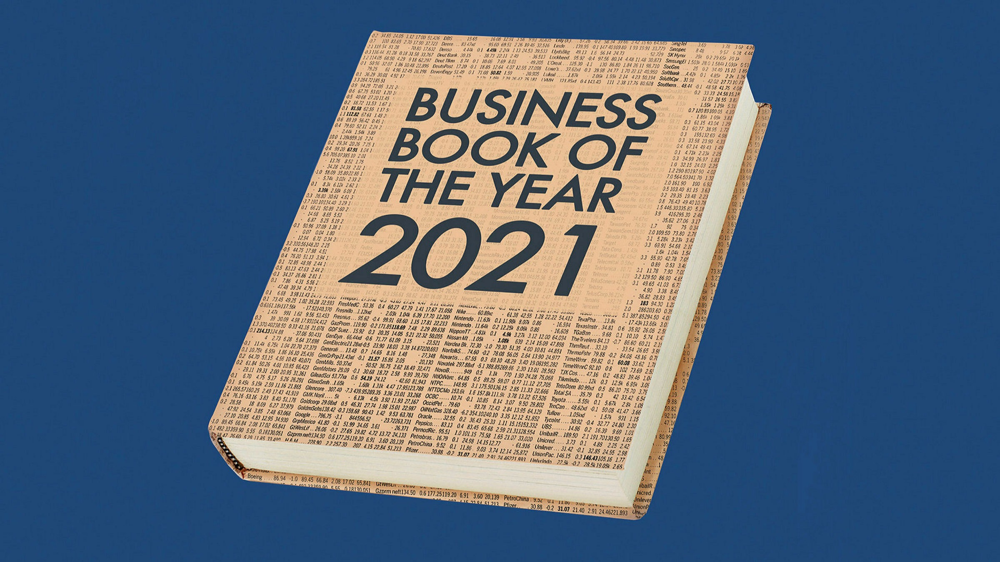


TOP DOWN VIEW


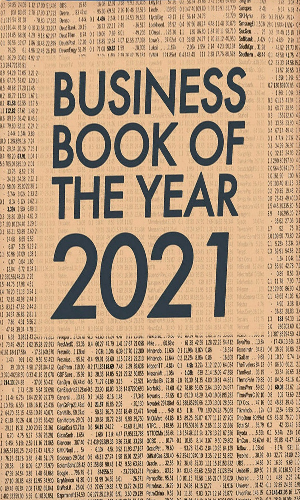

In [ ]:
#EXECUTE
img = cv2.imread('Input.jpg')
selection(img)

Enter Desired Width of TOP DOWN VIEW Window: 500
Enter Desired Height of TOP DOWN VIEW Window: 500

MANUALLY SELECT POINTS:
SELECT POINTS IN THE FORM:

o (X1, Y1)			o (X2, Y2)




o (X4, Y4)			o (X3, Y3)

X1: 55
Y1: 638
X2: 238
Y2: 607
X3: 238
Y3: 827
X4: 55
Y4: 840

Input Image:


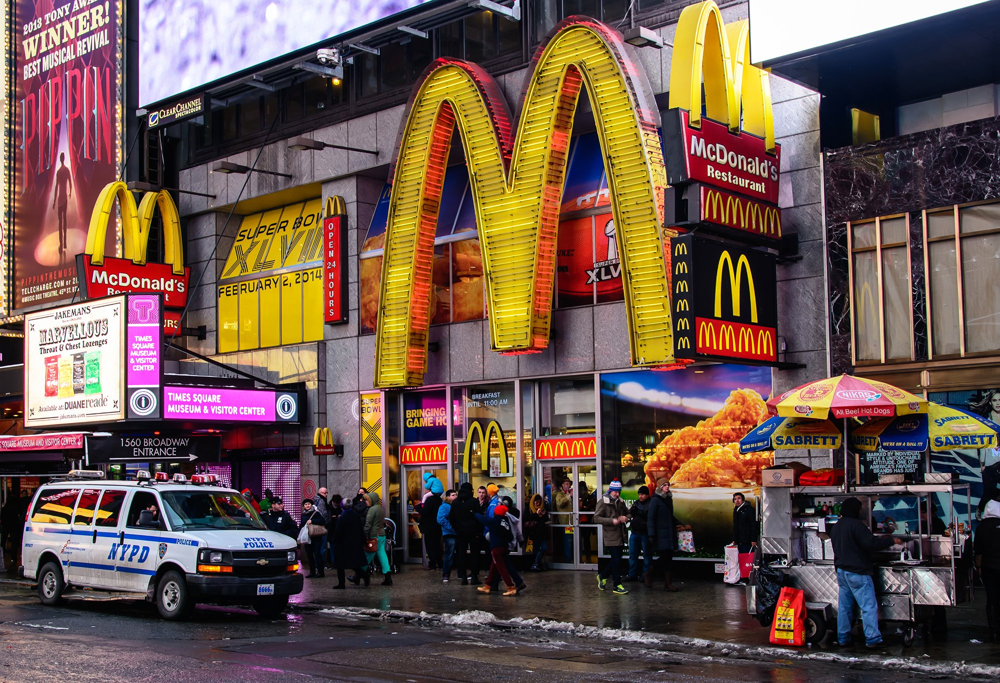


TOP DOWN VIEW


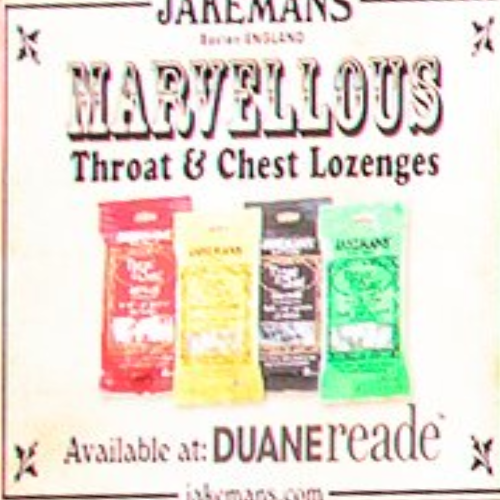

In [ ]:
#Execute
img2 = cv2.imread('Input2.jpg')
selection(img2)

**PART 2 - AUTOMATIC SELECTION:**

In [ ]:
#IMPORT LIBRARIES
from skimage import io

In [ ]:
#DEFINE FUNCTIONS
def auto(img, corners):
  #Width and Height of your desired transformation window
  width = 300
  height = 500
 
  X1 = corners[6]
  Y1 = corners[7]
  X2 = corners[0]
  Y2 = corners[1]
  X3 = corners[2]
  Y3 = corners[3]
  X4 = corners[4]
  Y4 = corners[5]

  #Constructing Original and Warped Corner Arrays
  originalCorners = np.float32([[X1, Y1], [X2, Y2], [X3, Y3], [X4, Y4]])
  warpedCorners = np.float32([[0, 0], [width, 0], [width, height], [0, height]])

  #Contstructing Homography Using Homework 5 Function
  myHomography = computeH(originalCorners, warpedCorners)

  #Warp Input Image using CV2 Function
  myWarp = cv2.warpPerspective(img, myHomography, (width, height))
  #Show Rectified Image
  print("\nTOP DOWN VIEW")
  cv2_imshow(myWarp)

Input Image


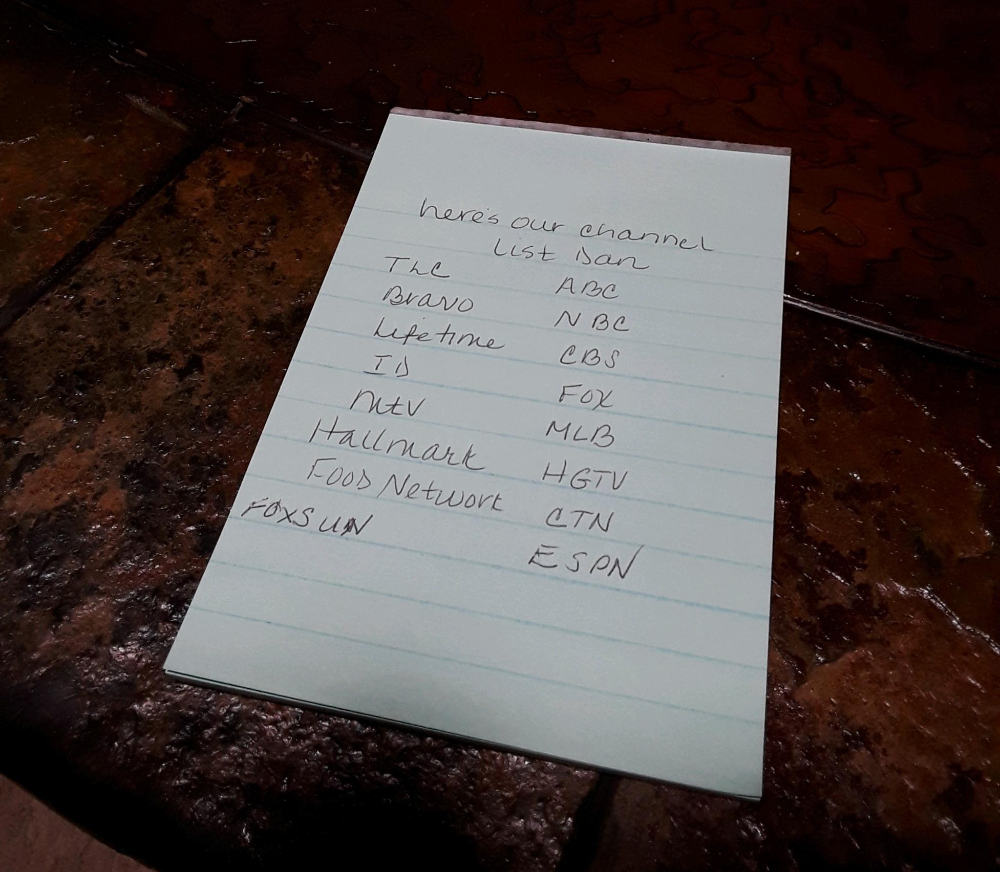


Filtered Image


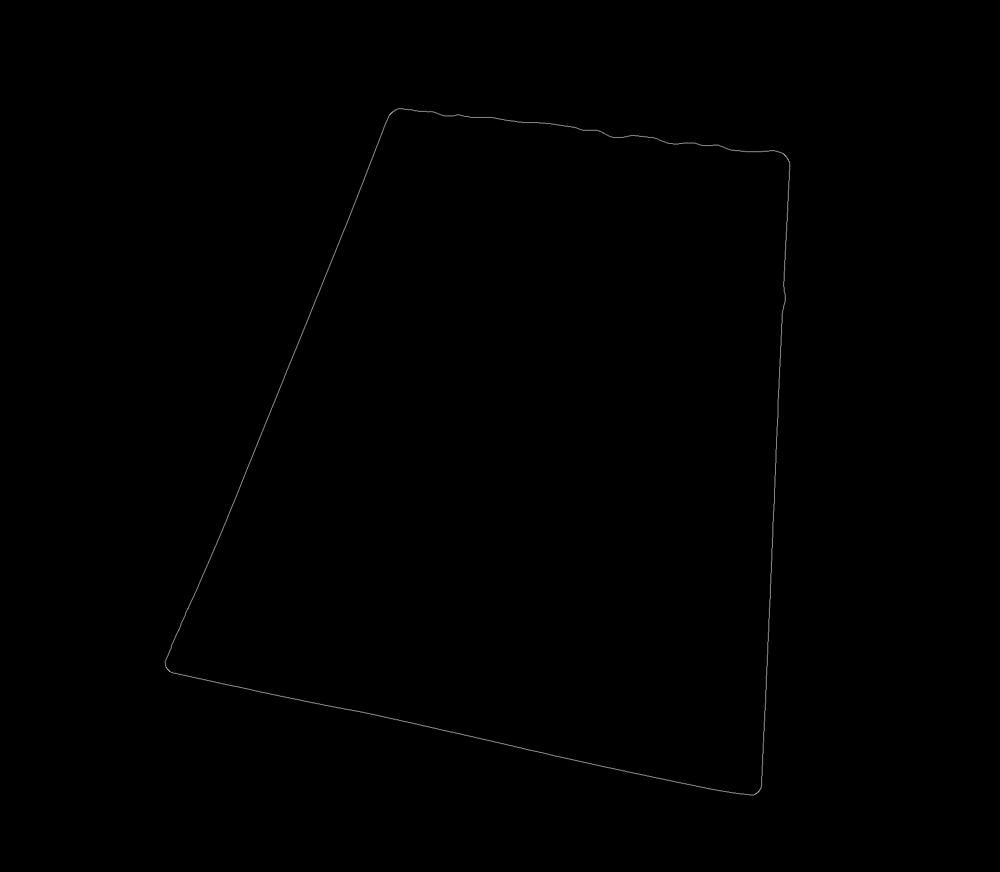


Four Points


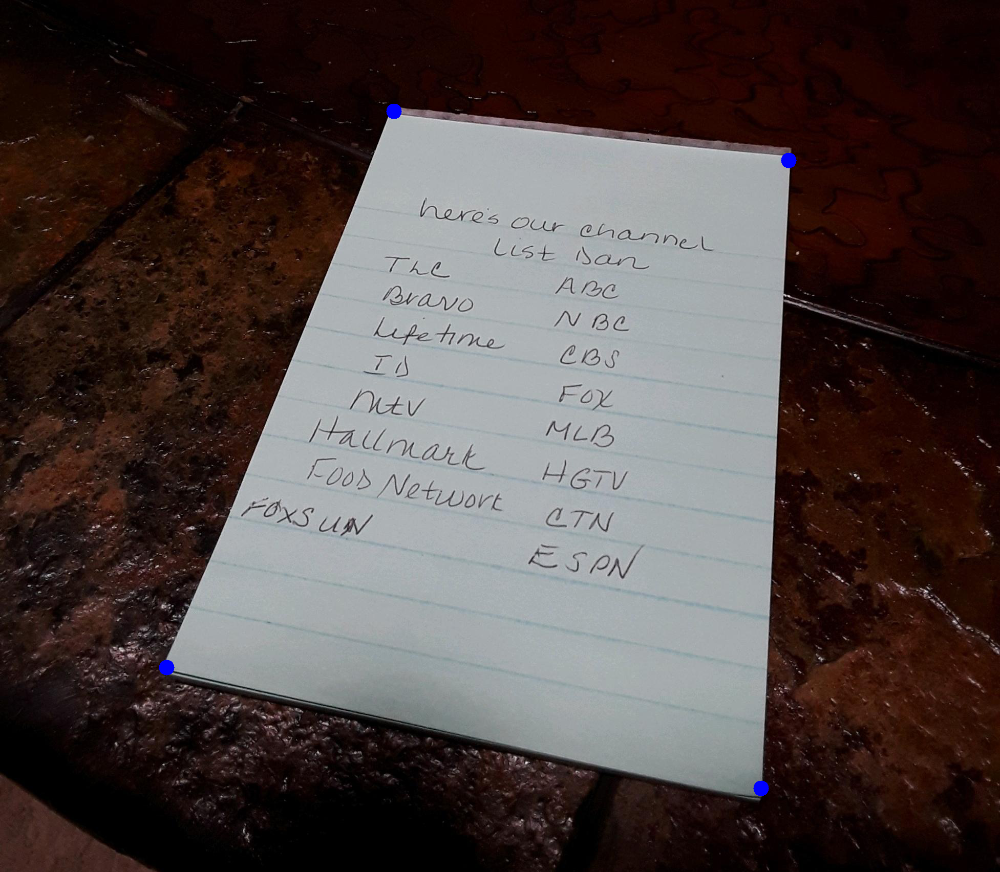


TOP DOWN VIEW


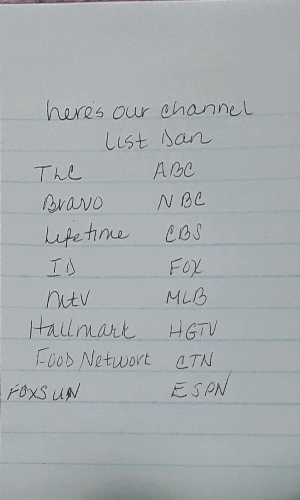

In [ ]:

url = 'https://i.redd.it/bebi64i3kbb31.jpg'
image = io.imread(url)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

#This combination of filters isolates the outline of the document
gray = cv2.medianBlur(gray, 31)
th, gray = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)
gray = cv2.Canny(gray, 50, 255, 1)

#Feature Point detection where I can limit it to 4 points
corners = cv2.goodFeaturesToTrack(gray, 4, 0.5, 400)
circles = corners
circleCopy = image.copy()
corners = corners.ravel()

print("Input Image")
cv2_imshow(image)
print("\nFiltered Image")
cv2_imshow(gray)
for circle in circles:
  x, y = circle.ravel()
  cv2.circle(circleCopy, (x, y), 15, 255, -1)
print("\nFour Points")
cv2_imshow(circleCopy)

auto(image, corners)

**PART 3 - REPORT:**

As I was working, I noticed that the shine on the countertop was producing a lot of bright spots that interfered with the thresholding. First I ran the image through a Median Filter. I did this because the median filter is good at removing noise from the image. Next I ran the image through a threshold, this will help the edge detection by providing clear gradients. Lastly, I performed Canny Edge Detection on the image which resulted in an outline of the document.

To find the four corners of the document I used the Open CV function: goodFeaturesToTrack(). This allowed me to limit the number of key points detected to only 4 and it returned their coordinates. I then ran the points through a function similar to the one used in the previous part to construct the homography and perform the warp.

There are some flaws in my design however. This program relies on an input image where the document is on a surface with a distinctly different color than it. Additionally, it may encounter issues with regards to scale. The goodFeaturesToTrack() function was returning points that were edges, not corners at first. To fix this, I adjusted the last parameter of the function which is minimum distance between points (currently set to 400). Obviously if the image were smaller, this could result in an error or improper output.
